<div dir=rtl>

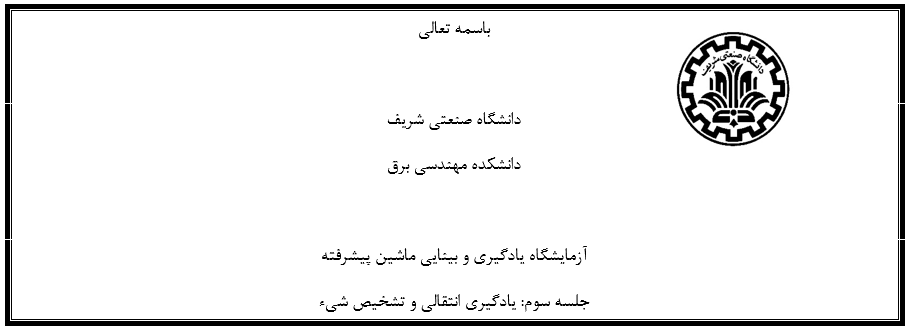

<div dir=rtl>

نام و نام‌خانوادگی: حامد آجورلو

شماره دانشجویی: 97101167

----



<div dir=rtl>

#  آزمايش اول: تشخيص شیء

----



<div dir=rtl>


در اين آزمايش می‌خواهيم يک شبکه برای مشخص نمودن شیء‌های هواپيما داخل تصوير با استفاده از R-CNN، طراحی کنيم. 


برای دریافت دیتاست به لینک روبه رو مراجعه کنید:
 [دیتاست](https://drive.google.com/drive/folders/1cYlGyRhfHZkqegJiBCnmu-DCbZPZLSsu?usp=sharing)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<div dir=rtl>

## 1.	آشنایی با دیتاست

با استفاده از کتابخانه opencv و pandas، سه نمونه ابتدايی را همراه با کادر مشخص کننده اشيا در تصوير مطابق نمونه ، رسم کنيد.



In [ ]:
########
import os,cv2,keras
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random


#### read boxes from annotation files

def get_rectangle(csv_annot):
  boxes=[]
  df1 = pd.read_csv(csv_annot)
  for i in range(0,int(df1.columns[0])):
    row_1=df1.iloc[i]
    data = row_1[0].split() 
    boxes.append(data)
  return boxes

annotation_path ="/content/drive/MyDrive/dataset/Annotations_train/"
dataset_path ="/content/drive/MyDrive/dataset/Images_train"

#### image with box

rect1=get_rectangle(annotation_path+'airplane_001.csv')
rect2=get_rectangle(annotation_path+'airplane_002.csv')
rect3=get_rectangle(annotation_path+'airplane_003.csv')


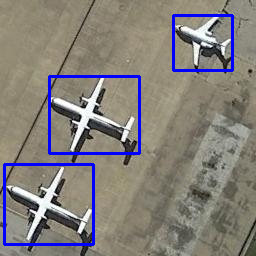

In [ ]:
import cv2 
from google.colab.patches import cv2_imshow
path = "/content/drive/MyDrive/dataset/Images_train/airplane_001.jpg"
image = cv2.imread(path)
start_point1 = (int(rect1[0][0]),int(rect1[0][1]))
end_point1 = (int(rect1[0][2]),int(rect1[0][3]))

start_point2 = (int(rect1[1][0]),int(rect1[1][1]))
end_point2 = (int(rect1[1][2]),int(rect1[1][3]))

start_point3 = (int(rect1[2][0]),int(rect1[2][1]))
end_point3 = (int(rect1[2][2]),int(rect1[2][3]))

# Blue color in BGR
color = (255, 0, 0)
  
# Line thickness of 2 px
thickness = 2
  
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
image = cv2.rectangle(image, start_point1, end_point1, color, thickness)
image = cv2.rectangle(image, start_point2, end_point2, color, thickness)
image = cv2.rectangle(image, start_point3, end_point3, color, thickness)

# Displaying the image 
cv2_imshow(image)

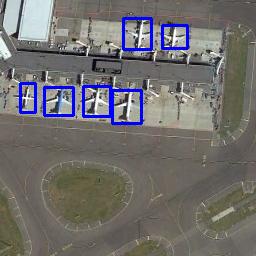

In [ ]:
import cv2 
from google.colab.patches import cv2_imshow
path = "/content/drive/MyDrive/dataset/Images_train/airplane_002.jpg"
image = cv2.imread(path)
start_point1 = (int(rect2[0][0]),int(rect2[0][1]))
end_point1 = (int(rect2[0][2]),int(rect2[0][3]))

start_point2 = (int(rect2[1][0]),int(rect2[1][1]))
end_point2 = (int(rect2[1][2]),int(rect2[1][3]))

start_point3 = (int(rect2[2][0]),int(rect2[2][1]))
end_point3 = (int(rect2[2][2]),int(rect2[2][3]))

start_point4 = (int(rect2[3][0]),int(rect2[3][1]))
end_point4 = (int(rect2[3][2]),int(rect2[3][3]))

start_point5 = (int(rect2[4][0]),int(rect2[4][1]))
end_point5 = (int(rect2[4][2]),int(rect2[4][3]))

start_point6 = (int(rect2[5][0]),int(rect2[5][1]))
end_point6 = (int(rect2[5][2]),int(rect2[5][3]))

color = (255, 0, 0)
  
thickness = 2
  
image = cv2.rectangle(image, start_point1, end_point1, color, thickness)
image = cv2.rectangle(image, start_point2, end_point2, color, thickness)
image = cv2.rectangle(image, start_point3, end_point3, color, thickness)
image = cv2.rectangle(image, start_point4, end_point4, color, thickness)
image = cv2.rectangle(image, start_point5, end_point5, color, thickness)
image = cv2.rectangle(image, start_point6, end_point6, color, thickness)

cv2_imshow(image)

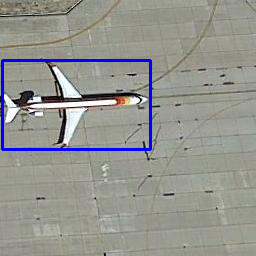

In [ ]:
import cv2 
from google.colab.patches import cv2_imshow
path = "/content/drive/MyDrive/dataset/Images_train/airplane_003.jpg"
image = cv2.imread(path)

start_point1 = (int(rect3[0][0]),int(rect3[0][1]))
end_point1 = (int(rect3[0][2]),int(rect3[0][3]))

color = (255, 0, 0)
  
thickness = 2

image = cv2.rectangle(image, start_point1, end_point1, color, thickness)

cv2_imshow(image)

<div dir=rtl>

## 2.	محاسبه boxها با استفاده از selective search

با استفاده از الگوريتم جستجوی انتخابی، 2000 ناحيه برای هر تصوير محاسبه کنيد و ناحيه‌های محاسبه شده برای airplane_001 را بر روی تصوير نشان دهيد.



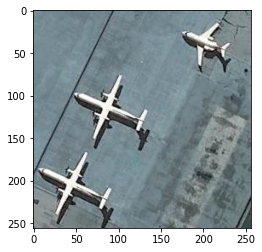

In [ ]:
max_proposal = 2000


img_name= "/content/drive/MyDrive/dataset/Images_train/airplane_001.jpg"
img  = cv2.imread(img_name)
plt.imshow(img)


#### find rectangles with selective search
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(img)
ss.switchToSelectiveSearchFast()
rects = ss.process()


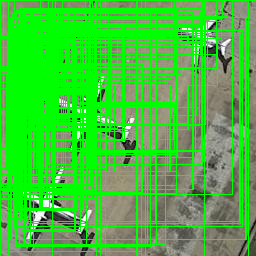

In [ ]:
for i, rect in (enumerate(rects)):
  p=cv2.rectangle(img, (rect[0],rect[1]),(rect[2],rect[3]),(0,255,0),1)
cv2_imshow(p)

<div dir=rtl>

## 3.تشکیل دیتاست

برای آموزش شبکه، نياز به تصاوير همراه با ليبل می‌باشد. مطابق توضيحات زير، با استفاده از تصاوير ورودی، يک ديتاست تشکيل دهيد:
•	به ازای هر تصوير با استفاده الگوريتم جستجوی انتخابی، حداکثر 2000 ناحيه محاسبه کنيد.
•	مقدار IoU را برای ناحيه پيشنهادی نسبت به هر يک از نواحی موجود ارائه شده در فايل annotation تصوير مربوطه محاسبه کنيد:
i.	در صورتی که IoU > 0.7 باشد، 
1.	تصوير موجود در ناحيه پيشنهادی را استخراج کنيد و ابعاد آن را به 224x224 تغيير دهيد، سپس آن رابه‌عنوان ورودی به ديتاست اضافه کنيد.
2.	ليبل داده ورودی رابرابر 1 قرار دهيد.
ii.	در صورتی که IoU < 0.3 باشد، 
1.	تصوير موجود در ناحيه پيشنهادی را استخراج کنيد و ابعاد آن را به 224x224 تغيير دهيد، سپس آن رابه‌عنوان ورودی به ديتاست اضافه کنيد.
2.	ليبل داده ورودی را برابر 0 قرار دهيد.
** به‌ازای هر تصوير از ديتاست اصلی حداکثر 30 داده با ليبل 0 و حداکثر 30 داده با ليبل 1 مطابق توضيحات ارائه شده، محاسبه کنيد.
iii.	بعد از تشکيل ديتاست نهايی، 90 درصد داده‌ها را به‌عنوان داده آموزش و 10 درصد را به‌عنوان داده تست قرار دهيد.


In [ ]:
import os
def annot(csv_annot):
  boxes = {}
  for box in os.listdir(annotation_path):
    loc2 = annotation_path +'/'+ box
    df = pd.read_csv(loc2)
    boxes[loc2[-6:-4]] = df
  return boxes

In [ ]:
import matplotlib.pyplot as plt
Dataset = {}
annotation = {}
for picture in os.listdir(dataset_path):
    loc1 = dataset_path + '/'+picture
    pix = plt.imread(loc1)
    Dataset[loc1[-6:-4]] = pix

annotation = annot(annotation_path)

In [ ]:
def get_iou(bb1, bb2):

    xA = max(int(bb1[0]), int(bb2[0]))
    yA = max(int(bb1[1]), int(bb2[1]))
    xB = min(int(bb1[2]), int(bb2[2]))
    yB = min(int(bb1[3]), int(bb2[3]))
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (int(bb1[2]) - int(bb1[0]) + 1) * (int(bb1[3]) - int(bb1[1]) + 1)
    boxBArea = (int(bb2[2]) - int(bb2[0]) + 1) * (int(bb2[3]) - int(bb2[1]) + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

In [ ]:
max_samples = 30
IOU_treshold_plane = 0.7
IOU_treshold_background = 0.3

train_images = []
train_labels = []

for i in Dataset.keys():

  component = Dataset[i]
  A = annotation[i]
  cv2.setUseOptimized(True);
  ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
  ss.setBaseImage(component)
  ss.switchToSelectiveSearchFast()
  rects = ss.process()

  N1 = 0
  N0 = 0
  for k in range(len(rects)):

      rect = rects[k]
      new = rect
      new[0] = rect[0]
      new[1] = rect[1]
      new[2] = rect[0] + rect[2]
      new[3] = rect[1] + rect[3]

      for j in range(int(A.columns[0])):
        a = A.iloc[j, 0]
        a = list(map(int, a.split(' ')))
        iou = get_iou(a, new)
        
        if(iou > IOU_treshold_plane) and (N1 < max_samples):
          train_images.append(cv2.resize(component[new[1]:new[3],new[0]:new[2],:], (224, 224), interpolation = cv2.INTER_AREA))
          train_labels.append(1)
          N1 += 1
          break
        
        if((iou < IOU_treshold_background) and (N0 < max_samples) and (j == int(A.columns[0]) - 1)):
          train_images.append(cv2.resize(component[new[1]:new[3],new[0]:new[2], :], (224, 224), interpolation = cv2.INTER_AREA))
          train_labels.append(0)
          N0 += 1
          break

In [ ]:
### train and test data

from sklearn.model_selection import train_test_split

X = np.array(train_images)
y = np.array(train_labels)
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size = 0.1, shuffle = True)

<div dir=rtl>

## 4. تعریف مدل

برای طبقه‌بندی از مدل VGG 16 استفاده کنيد. 

برای تعريف شبکه VGG16، از می‌توانيد از دستور tf.keras.applications.vgg16.VGG16 استفاده کنيد.
الف: وزن اوليه شبکه را برابر “imagenet” قرار دهيد.
ب: يادگيری انتقالی: شبکه pre-trained را به شکل زير تنظيم کنيد:
-	وزن 13 لايه ابتدايی را به وضعيت غيرقابل آموزش تغيير دهيد.
-	لايه انتهايی شبکه VGG16 که شامل يک لايه تماما متصل با 1000 نورون است را با يک لايه تماما متصل با يک نورون و فعالساز softmax تغيير دهيد.
ج: مدل را با استفاده از داده‌های آموزش، محاسبه کنيد:
-	Epochs = 15
-	learning_rate = 0.0001, Optimizer = Adam
-	Loss function = binary_crossentropy
-	Metrics = accuracy
-	validation_data  را برابر داده‌های تست که از بخش سوم از داده‌های کل محاسبه شده‌اند قرار دهيد.
د: نمودار تغييرات دقت (accuracy) را به ازای هر epoh برای داده‌های آموزش و validation رسم کنيد.


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

vggmodel = tf.keras.applications.vgg16.VGG16(
    include_top=True,
    weights='imagenet',
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
)

for i in range(13):
  vggmodel.layers[i].trainable = False
x_in = vggmodel.layers[-2].output
x_out = Dense(1, activation = 'sigmoid')(x_in)

model = Model(inputs = vggmodel.input, outputs = x_out)
model.summary()


553476096/553467096 [==============================] - 4s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
### compile model + print summary

opt = Adam(learning_rate = 0.0001)
model.compile(optimizer = opt, loss = 'binary_crossentropy', metrics=['accuracy'])

## fit model

history = model.fit(X_train, y_train, validation_split = 0.1, epochs = 15, batch_size = 20, verbose = 1)




Epoch 1/15
60/60 [==============================] - 39s 433ms/step - loss: 0.4494 - accuracy: 0.8851 - val_loss: 0.1545 - val_accuracy: 0.9167
Epoch 2/15
60/60 [==============================] - 23s 376ms/step - loss: 0.1042 - accuracy: 0.9535 - val_loss: 0.2691 - val_accuracy: 0.9621
Epoch 3/15
60/60 [==============================] - 23s 376ms/step - loss: 0.1361 - accuracy: 0.9578 - val_loss: 0.1051 - val_accuracy: 0.9545
Epoch 4/15
60/60 [==============================] - 23s 376ms/step - loss: 0.1605 - accuracy: 0.9527 - val_loss: 0.0515 - val_accuracy: 0.9773
Epoch 5/15
60/60 [==============================] - 23s 376ms/step - loss: 0.0441 - accuracy: 0.9848 - val_loss: 0.0421 - val_accuracy: 0.9848
Epoch 6/15
60/60 [==============================] - 23s 376ms/step - loss: 0.0808 - accuracy: 0.9721 - val_loss: 0.1416 - val_accuracy: 0.9697
Epoch 7/15
60/60 [==============================] - 23s 376ms/step - loss: 0.0326 - accuracy: 0.9865 - val_loss: 0.0743 - val_accuracy: 0.9621

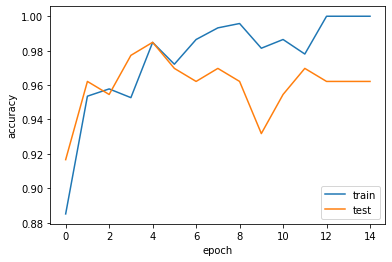

In [ ]:
#### fit model
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='lower right')
plt.show()





<div dir=rtl>

## 4. تشخیص شی بر روی داده های تست

با استفاده از مدل محاسبه شده، محل وجود شیء هواپيما را برای تصاوير موجود در فولدر Images_test، محاسبه و رسم کنيد:
-	ابتدا با استفاده از الگوريتم جستجوی انتخابی، ناحيه‌های پيشنهادی را محاسبه کنيد.
-	خروجی شبکه را به‌ازای هر ناحيه پيشنهادی محاسبه کنيد.
-	در صورتی که خروجی بيشتر ازth = 0.9  بود، آن ناحيه را به‌عنوان محل وجود شیء درنظر گرفته و در تصوير مشخص کنيد.
-	با کاهش و افزايش th، چه تغييراتی در خروجی حاصل می‌شود؟ دقيق‌ترين نتيجه به ازای چه مقداری از th به دست می‌آيد؟ بهترين نواحی محاسبه شده برای تصاوير تست را بر روی آنها رسم کرده و نمايش دهيد.



ابتدا با تنظیم آستانه روی 0.9 نتایج را مشاهده می نماییم و سپس مقدار آستانه را کم و زیاد می نماییم تا تاثیر آن را روی نتایج ببینیم

In [ ]:
import numpy as np
def non_max_suppression_fast(boxes, overlapThresh):
	if len(boxes) == 0:
		return []
	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")
	pick = []
	x1 = boxes[:,0]
	y1 = boxes[:,1]
	x2 = boxes[:,2]
	y2 = boxes[:,3]
	area = (x2 - x1 + 1) * (y2 - y1 + 1)
	idxs = np.argsort(y2)
	while len(idxs) > 0:
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)
		xx1 = np.maximum(x1[i], x1[idxs[:last]])
		yy1 = np.maximum(y1[i], y1[idxs[:last]])
		xx2 = np.minimum(x2[i], x2[idxs[:last]])
		yy2 = np.minimum(y2[i], y2[idxs[:last]])
		w = np.maximum(0, xx2 - xx1 + 1)
		h = np.maximum(0, yy2 - yy1 + 1)
		overlap = (w * h) / area[idxs[:last]]
		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlapThresh)[0])))
	return boxes[pick].astype("int")

بعد از بدست آمدن کادر های حاوی هواپیما با استفاده از روش سرکوب نقاط حداکثری بهترین کادر را می یابیم.

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix


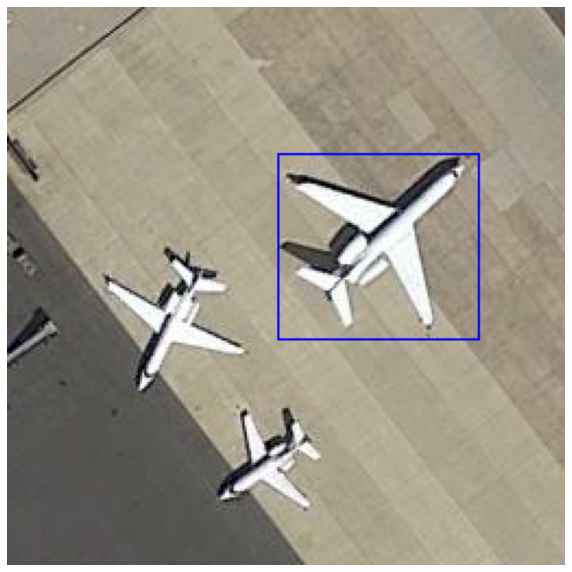

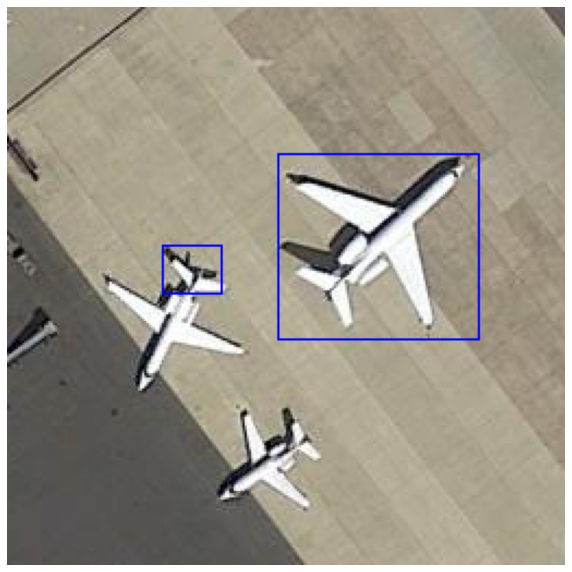

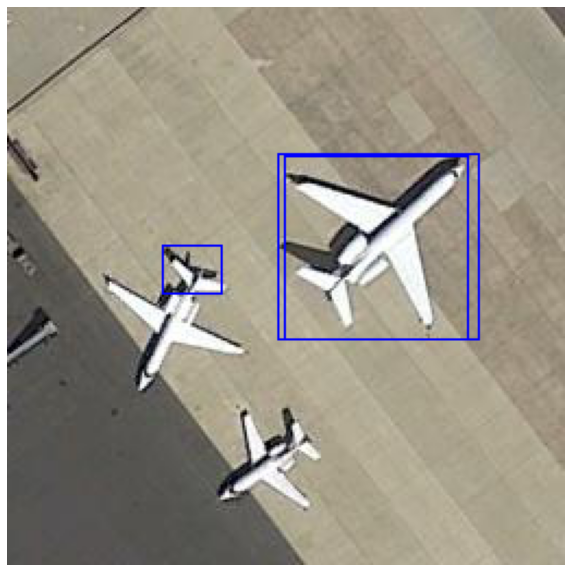

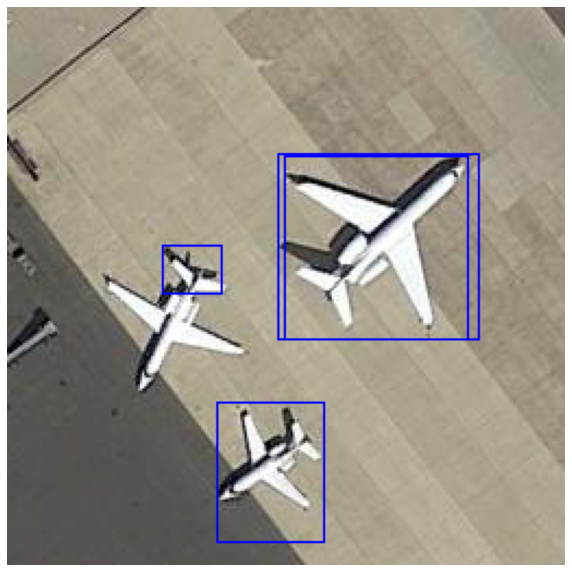

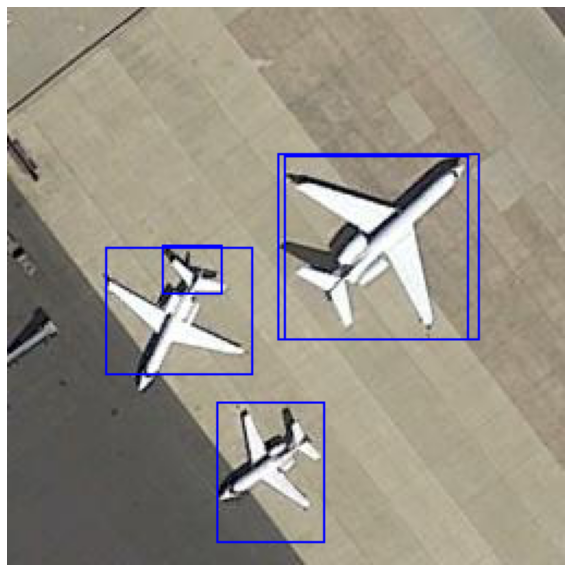

...

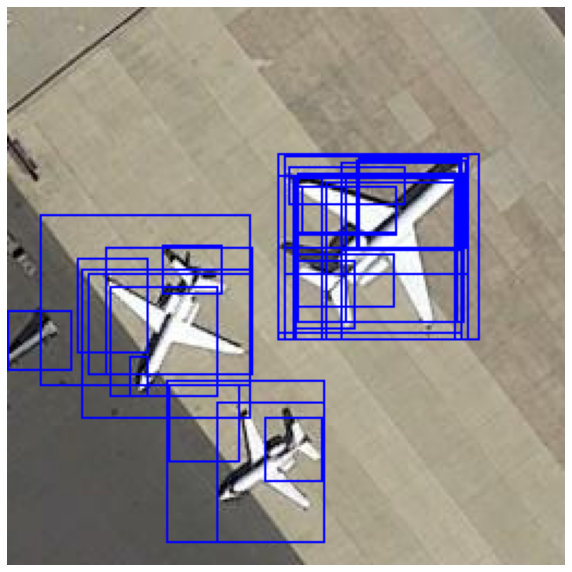

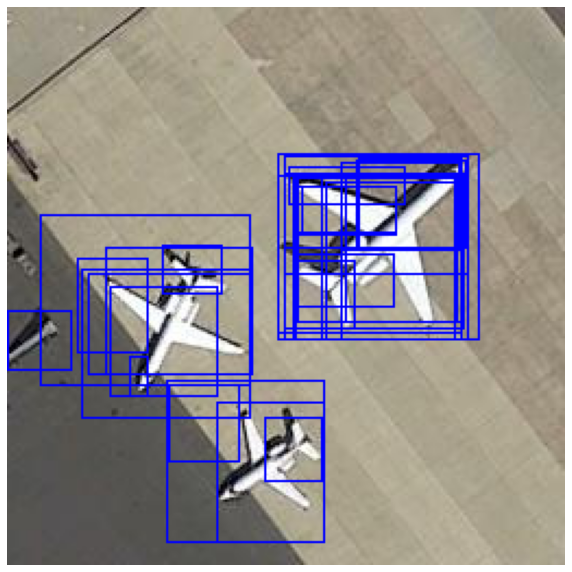

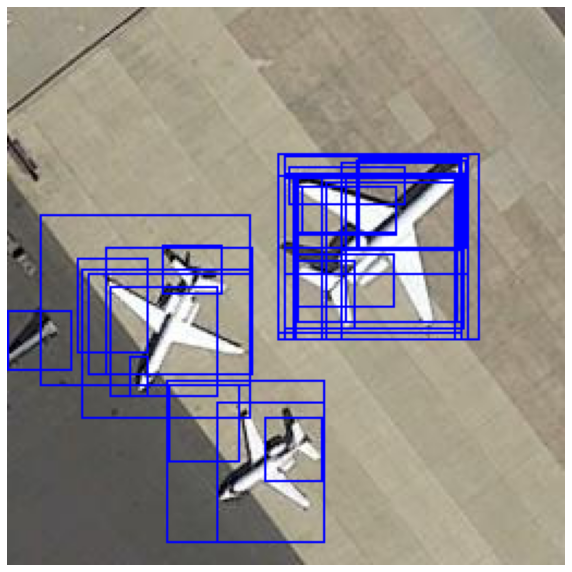

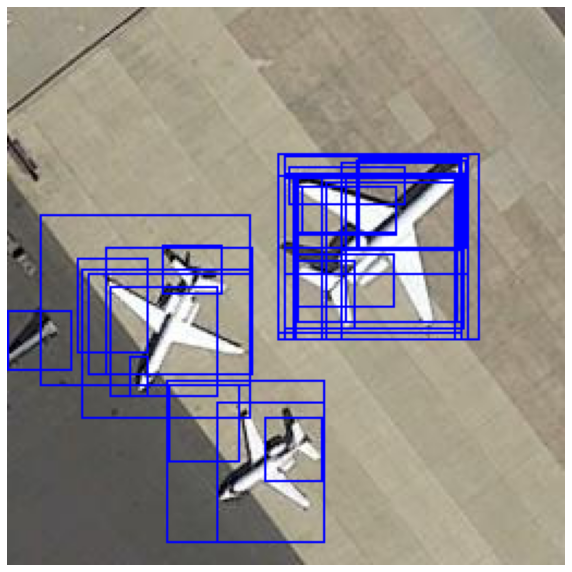

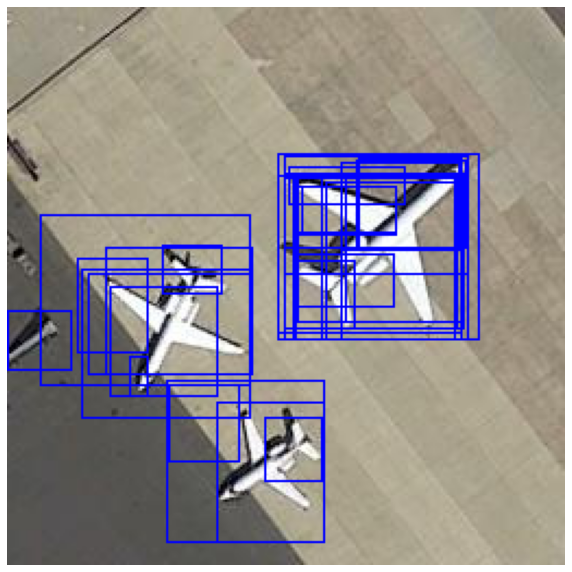

In [ ]:
finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.9):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])
        plt.figure(figsize=(10,20))
        plt.imshow(img1)
        plt.axis('off')
        plt.show()

(-0.5, 255.5, 255.5, -0.5)

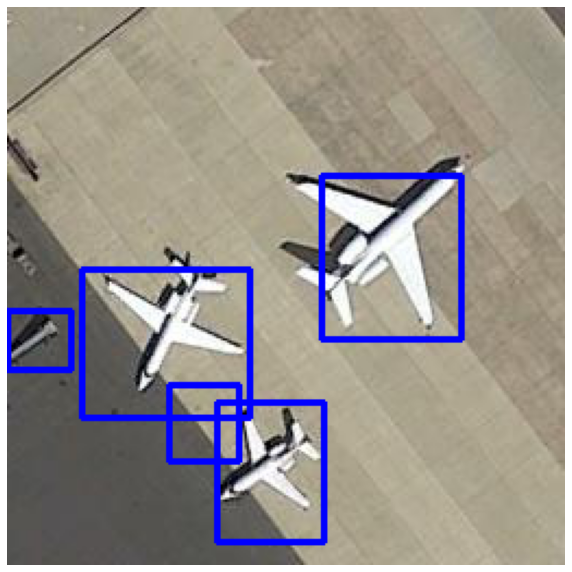

In [ ]:
finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.9

(-0.5, 255.5, 255.5, -0.5)

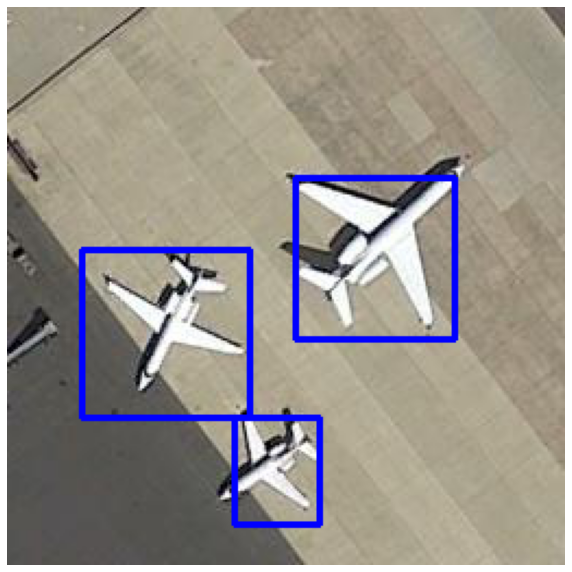

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.95):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.95

میبینیم که نتایج بدست آمده با استفاده از آستانه ی 0.95 بهتر از 0.9 می باشد .

(-0.5, 255.5, 255.5, -0.5)

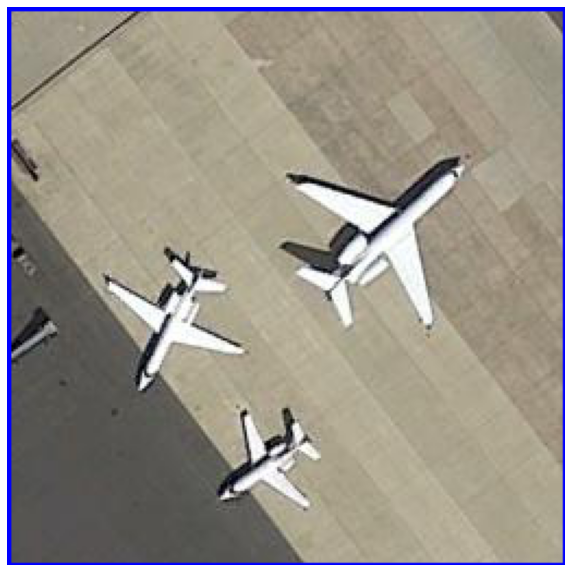

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.85):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.85

نتیجه ی بدست آمده اصلا قابل قبول نیست و ضعیف تر از دو آستانه ی قبلی است.

بنابراین بهترین آستانه ی بدست آمده 0.95 می باشد و روی دو تصویر دیگر با استفاده از این آستانه الگوریتم را اجرا می نماییم . 

(-0.5, 255.5, 255.5, -0.5)

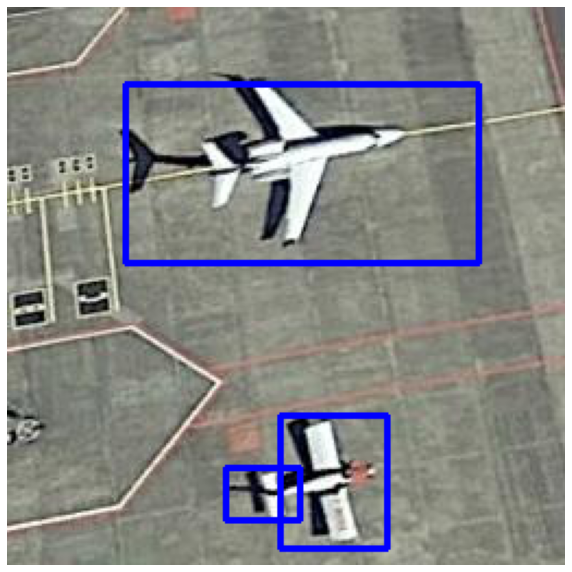

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_1']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.95):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_1']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.95

(-0.5, 255.5, 255.5, -0.5)

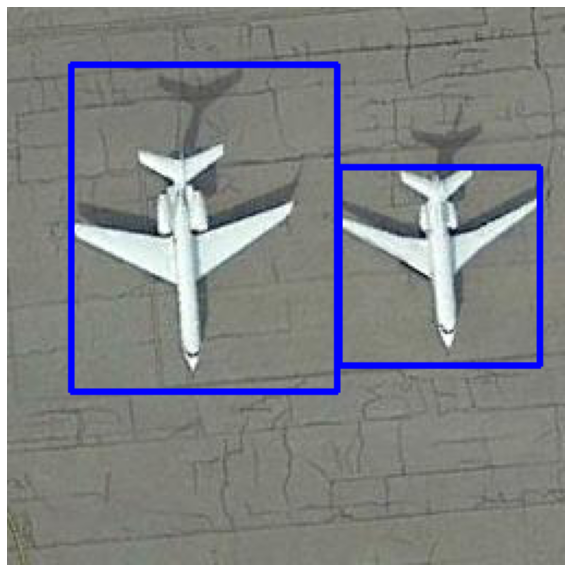

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_5']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.85):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_5']
for i in non_max_suppression_fast(finalized1,0.5):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.95

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

vggmodel = tf.keras.applications.vgg16.VGG16(
    include_top=True,
    weights=None,
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation='softmax'
)

for i in range(13):
  vggmodel.layers[i].trainable = False
x_in = vggmodel.layers[-2].output
x_out = Dense(1, activation = 'sigmoid')(x_in)

model = Model(inputs = vggmodel.input, outputs = x_out)
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
### compile model + print summary

opt = Adam(learning_rate = 0.0001)
model.compile(optimizer = opt, loss = 'binary_crossentropy', metrics=['accuracy'])

## fit model

history = model.fit(X_train, y_train, validation_split = 0.1, epochs = 15, batch_size = 20, verbose = 1)


Epoch 1/15
60/60 [==============================] - 25s 382ms/step - loss: 0.5590 - accuracy: 0.7939 - val_loss: 0.2892 - val_accuracy: 0.8864
Epoch 2/15
60/60 [==============================] - 23s 376ms/step - loss: 0.2818 - accuracy: 0.8919 - val_loss: 0.3710 - val_accuracy: 0.8712
Epoch 3/15
60/60 [==============================] - 22s 375ms/step - loss: 0.2414 - accuracy: 0.9105 - val_loss: 0.2450 - val_accuracy: 0.9015
Epoch 4/15
60/60 [==============================] - 22s 375ms/step - loss: 0.2218 - accuracy: 0.9189 - val_loss: 0.2472 - val_accuracy: 0.9394
Epoch 5/15
60/60 [==============================] - 22s 374ms/step - loss: 0.2289 - accuracy: 0.9105 - val_loss: 0.2322 - val_accuracy: 0.9167
Epoch 6/15
60/60 [==============================] - 22s 375ms/step - loss: 0.1674 - accuracy: 0.9392 - val_loss: 0.2957 - val_accuracy: 0.9015
Epoch 7/15
60/60 [==============================] - 22s 373ms/step - loss: 0.2161 - accuracy: 0.9223 - val_loss: 0.2123 - val_accuracy: 0.9318

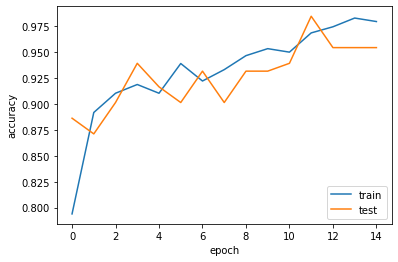

In [ ]:
#### fit model
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='lower right')
plt.show()



حال دوباره با 3 آستانه ی ذکر شده در قسمت قبل روی یکی از تصاویر الگوریتم را اجرا می نماییم

(-0.5, 255.5, 255.5, -0.5)

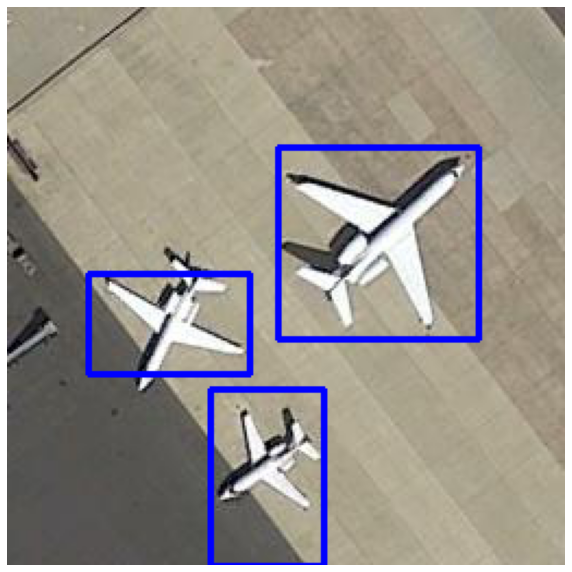

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.9):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.9

(-0.5, 255.5, 255.5, -0.5)

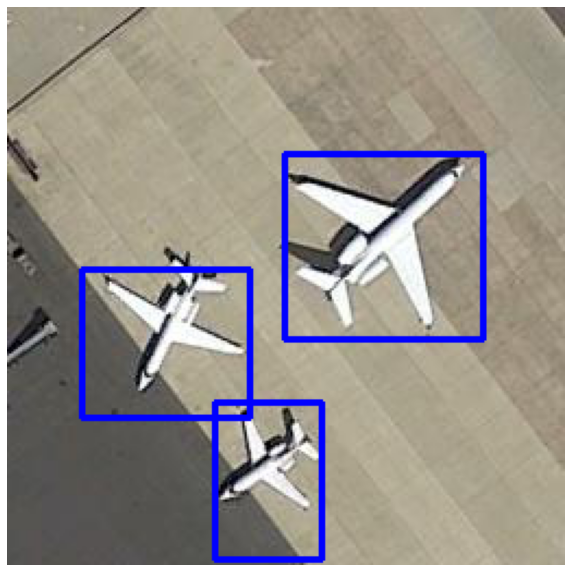

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.95):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.95

(-0.5, 255.5, 255.5, -0.5)

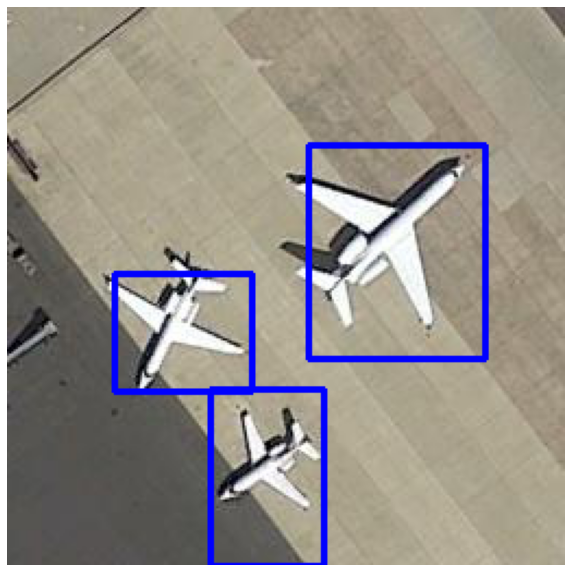

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_3']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.85):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_3']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

Threshold = 0.85

(-0.5, 255.5, 255.5, -0.5)

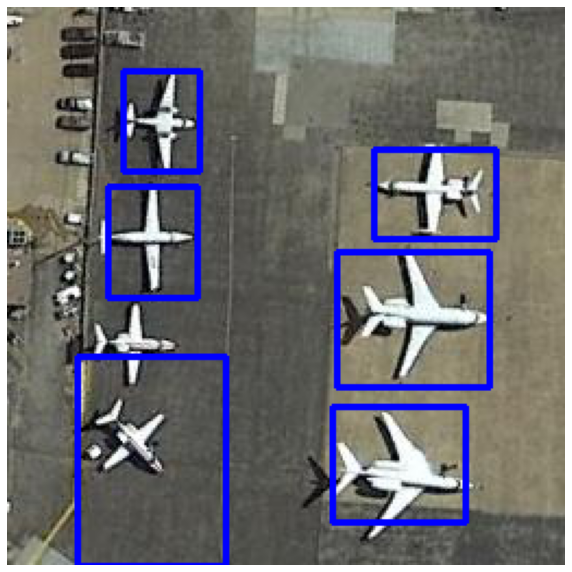

In [ ]:
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix

finalized=[]
component = test_Dataset['_6']
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(component)
ss.switchToSelectiveSearchFast()
rects = ss.process()

for k in range(len(rects)):
    rect = rects[k]
    new_test = rect
    new_test[0] = rect[0]
    new_test[1] = rect[1]
    new_test[2] = rect[0] + rect[2]
    new_test[3] = rect[1] + rect[3]
    img1 = component
    resized = cv2.resize(component[new_test[1]:new_test[3], new_test[0]: new_test[2], :], (224, 224), interpolation = cv2.INTER_AREA)
    img = np.expand_dims(resized, axis = 0)
    p = model.predict(img)
    if(p > 0.95):
        cv2.rectangle(img1,(new_test[0],new_test[1]),(new_test[2],new_test[3]),(0,0,255),1)
        finalized.append([new_test[0],new_test[1],new_test[2],new_test[3]])

finalized1=np.array(finalized)
test_Dataset = {}
address = '/content/drive/MyDrive/dataset/Images_test'
#### read the test images
for i in os.listdir(address):
    path = address +'/'+ i      
    pix = plt.imread(path)
    test_Dataset[path[-6:-4]] = pix
component = test_Dataset['_6']
for i in non_max_suppression_fast(finalized1,0.3):
  e=cv2.rectangle(component, (i[0],i[1]),(i[2],i[3]), (0,0,255), thickness)
plt.figure(figsize=(10,20))
plt.imshow(e)
plt.axis('off')

همانطور که در نمودار دقت رسم شده می بینیم با وزن دهی اولیه شبکه تصویر , زودتر به دقت بالایی می رسیم و با وزن دهی اولیه رندم زمان بیشتری طول می کشد تا به دقت برابر در شبکه ی قبل برسیم. همچنین بعضا می بینیم که شبکه با وزن دهی رندم در تشخیص بعضی هواپیما ها ناتوان است و به خوبی تشخیص نمی دهد .بنابراین پنجره های پیش نهادی در شبکه ی رندم عملکرد ضعیف تری دارند . و در مجموع می توان گفت استفاده از وزن دهی اولیه ی شبکه ی تصویر به بهبود نتایج کمک کرده است .